In [30]:
# imports

import os
from glob import glob
import cv2 # opencv
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import seaborn as sns
import pandas as pd

In [31]:
base_dir = '/Users/dkessner/Desktop/data/Kather_texture_2016_image_tiles_5000'


In [32]:
## Get labels of all classes in this dataset
img_labels = [i for i in os.listdir(base_dir) if not i.startswith('.')]
print('There are {} classes in this dataset:\n{}'.format(len(img_labels), img_labels))

There are 8 classes in this dataset:
['02_STROMA', '06_MUCOSA', '05_DEBRIS', '01_TUMOR', '03_COMPLEX', '08_EMPTY', '04_LYMPHO', '07_ADIPOSE']


In [33]:
tumor_files = glob(os.path.join(base_dir, img_labels[0], '*.tif'))
stroma_files = glob(os.path.join(base_dir, img_labels[1], '*.tif'))
complex_files = glob(os.path.join(base_dir, img_labels[2], '*.tif'))
lympho_files = glob(os.path.join(base_dir, img_labels[3], '*.tif'))
debris_files = glob(os.path.join(base_dir, img_labels[4], '*.tif'))
mucosa_files = glob(os.path.join(base_dir, img_labels[5], '*.tif'))
adipose_files = glob(os.path.join(base_dir, img_labels[6], '*.tif'))
empty_files = glob(os.path.join(base_dir, img_labels[7], '*.tif'))
img_files = [tumor_files, stroma_files, complex_files, lympho_files, debris_files, mucosa_files, adipose_files, empty_files]
total_files = [img for folder in img_files for img in folder]

In [34]:
len(total_files)

5000

In [20]:
print('Total number of images in this dataset: {}'.format(len(total_files)))
print ('-'*50)
for i in range(8):
    print('Number of images for {} category: {}'.format(img_labels[i].split('_')[1], len(img_files[i])))

Total number of images in this dataset: 5000
--------------------------------------------------
Number of images for STROMA category: 625
Number of images for MUCOSA category: 625
Number of images for DEBRIS category: 625
Number of images for TUMOR category: 625
Number of images for COMPLEX category: 625
Number of images for EMPTY category: 625
Number of images for LYMPHO category: 625
Number of images for ADIPOSE category: 625


In [21]:
## OpenCV loads color images in BGR mode. For visualization by matplotlib, images need to be converted to RGB mode
def readImage_rgb(img_path):
    '''OpenCV loads color images in BGR mode and converts to RGB mode for visualization;
       output: (H x W x n_channel)'''
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    return img_rgb

In [22]:
img = readImage_rgb(img_files[0][0])
print(img.shape)

(150, 150, 3)


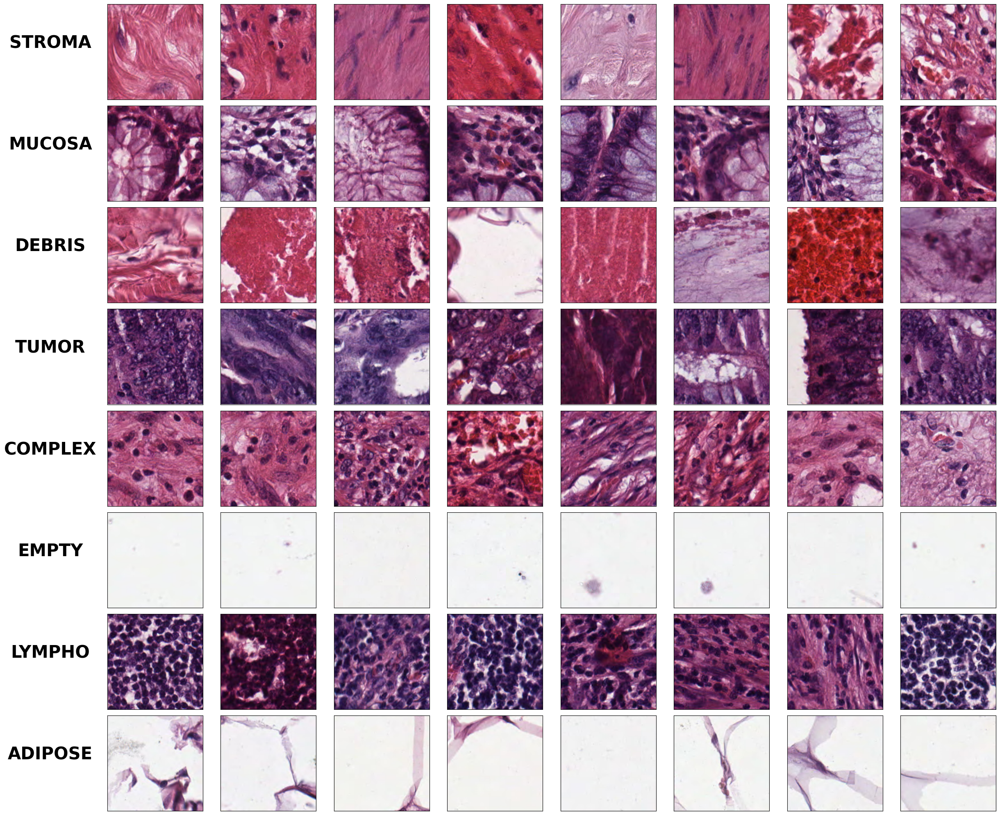

In [23]:
def plotImage_cat(img_files, img_labels):
    fig = plt.figure(figsize=(25,20))
    for i in np.arange(len(img_labels)):
        img_paths = img_files[i]
        img_label = img_labels[i]
        np.random.shuffle(img_paths)
        img_paths = img_paths[:8]
        for j, img_path in enumerate(img_paths):
            fig.add_subplot(8,8,i*8+j+1, xticks = [], yticks = [])
            plt.imshow(readImage_rgb(img_path))
            if j == 0:
                plt.ylabel(img_label.split('_')[1], rotation = 0, labelpad=100, fontsize=30, fontweight = 'bold')
    plt.tight_layout()    
    #fig.savefig('Histology.png')
plotImage_cat(img_files, img_labels)

In [24]:
def plotImage_rgb(img_paths, img_label):
    '''Plot image in each of RGB (red/green/blue) channels separately and in RGB mode'''
    np.random.shuffle(img_paths)
    img_path = img_paths[0]
    img_rgb = readImage_rgb(img_path)
     
    fig = plt.figure(figsize=(20,8))
    channels = ['Red', 'Green', 'Blue']
    color = ['r','g','b']
    
    for idx in np.arange(3):
        plt.subplot(1,4,idx+1)
        img = img_rgb[:,:,idx]
        plt.imshow(img, cmap = 'gray')
        plt.title(channels[idx], color = color[idx], fontsize = 30)
        
    plt.subplot(1,4,4)
    plt.imshow(img_rgb)
    plt.title('RGB', fontsize = 30)
    fig.suptitle('H&E image of {} area'.format(img_label), fontsize = 36) 
    
    plt.tight_layout()
    

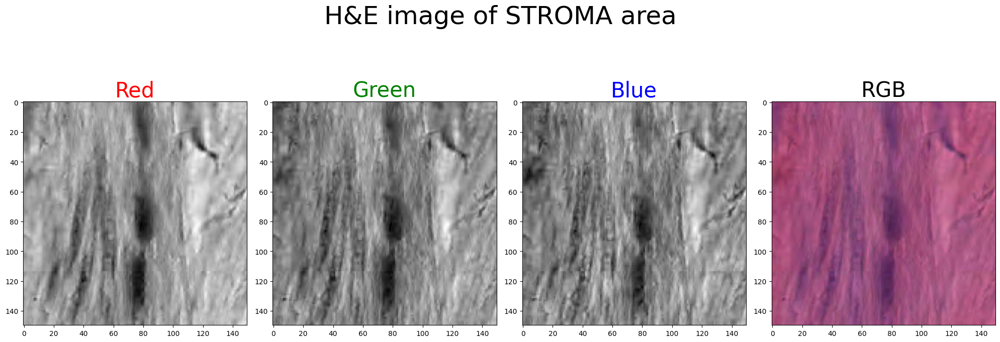

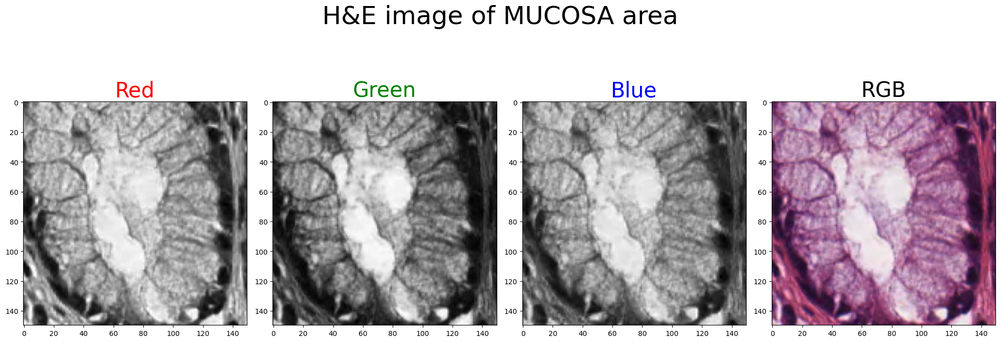

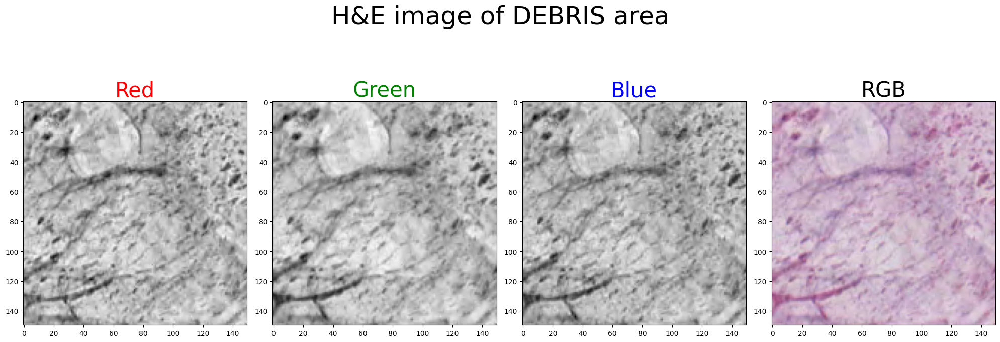

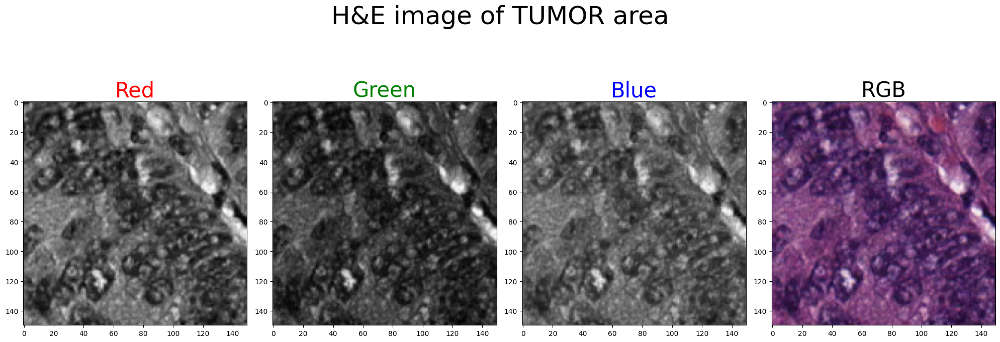

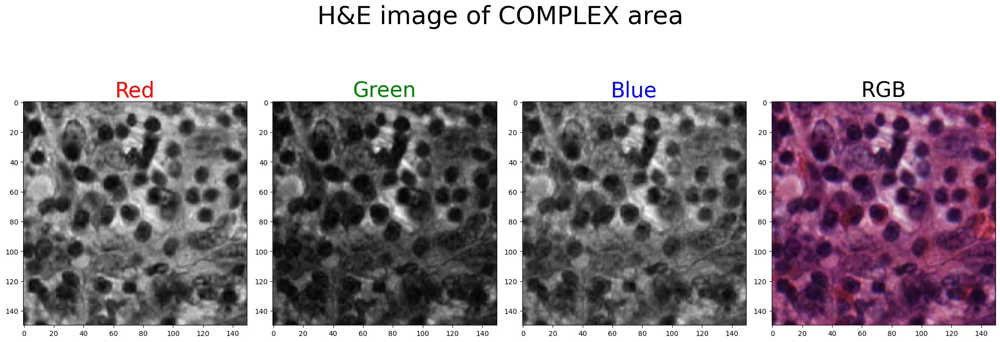

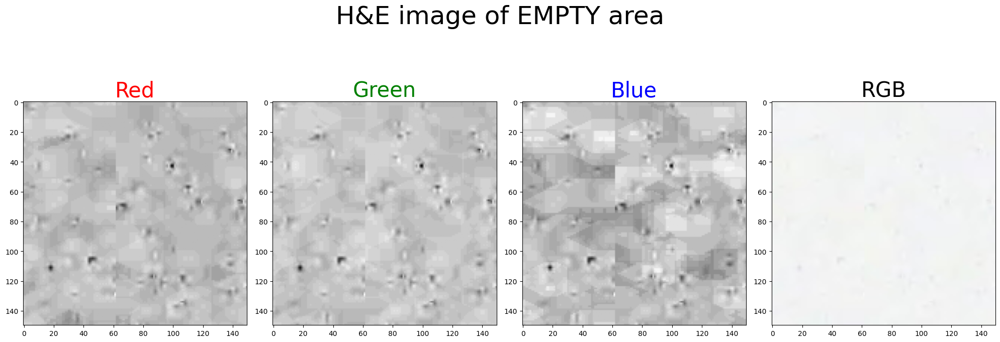

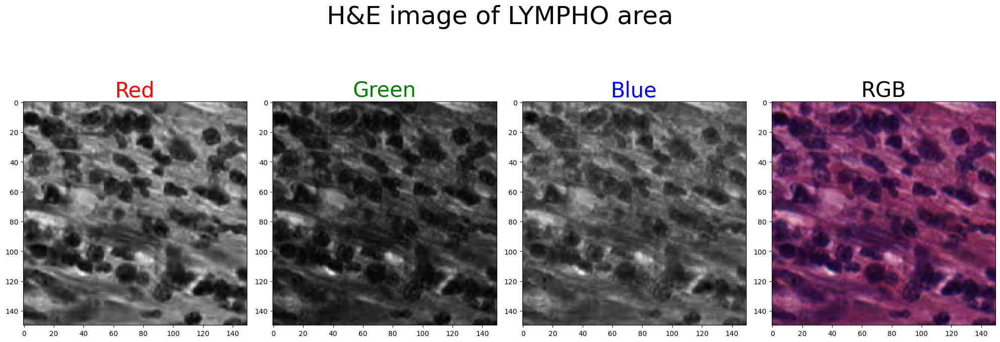

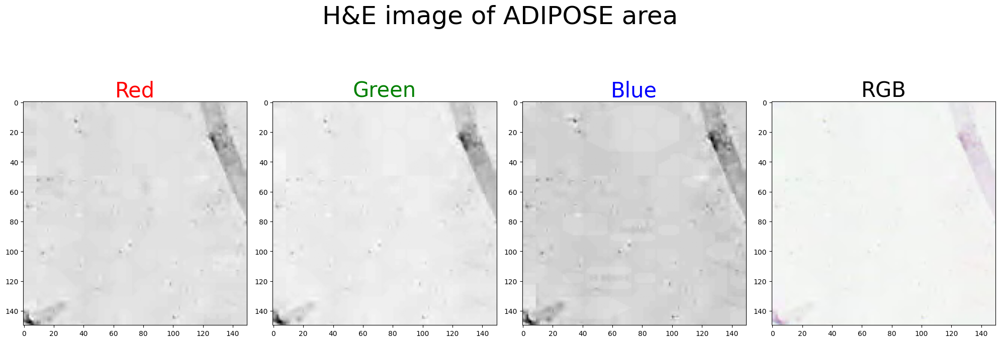

In [25]:
for i in np.arange(8):
    plotImage_rgb(img_files[i], img_labels[i].split('_')[1])

In [28]:
def image_summary(image_paths, img_label):
    img_dict = {}
    for i in range(len(image_paths)):
        img_path = image_paths[i]
        img_dict[img_path] = {}
        img = cv2.imread(img_path)
        img_dict[img_path]['label'] = img_label
        img_dict[img_path]['max'] = img.max()
        img_dict[img_path]['min'] = img.min()
        
        channel_mean = img.mean(axis = (0,1), keepdims = True).squeeze()
        channel_std = img.std(axis = (0,1), keepdims = True).squeeze()
        channel_q01 = np.quantile(img, 0.1, axis=(0,1), keepdims=True).squeeze()
        channel_q09 = np.quantile(img, 0.9, axis=(0,1), keepdims=True).squeeze()
        img_dict[img_path]['red_mean'], img_dict[img_path]['green_mean'], img_dict[img_path]['blue_mean'] = channel_mean
        img_dict[img_path]['red_std'], img_dict[img_path]['green_std'], img_dict[img_path]['blue_std'] = channel_std
        img_dict[img_path]['red_q01'], img_dict[img_path]['green_q01'], img_dict[img_path]['blue_q01'] = channel_q01
        img_dict[img_path]['red_q09'], img_dict[img_path]['green_q09'], img_dict[img_path]['blue_q09'] = channel_q09
        
    img_df = pd.DataFrame.from_dict(img_dict, orient = 'index')
    return img_df

In [35]:
tumor_files_df = image_summary(tumor_files, 'TUMOR')
stroma_files_df = image_summary(stroma_files, 'STROMA')
complex_files_df = image_summary(complex_files, 'COMPLEX')
lympho_files_df = image_summary(lympho_files, 'LYMPHO')
debris_files_df = image_summary(debris_files, 'DEBRIS')
mucosa_files_df = image_summary(mucosa_files, 'MUCOSA')
adipose_files_df = image_summary(adipose_files, 'ADIPOSE')
empty_files_df = image_summary(empty_files, 'EMPTY')

In [36]:
pixel_df = pd.concat([tumor_files_df, stroma_files_df, complex_files_df, lympho_files_df, debris_files_df, mucosa_files_df, adipose_files_df, empty_files_df])
pixel_df.shape

(5000, 15)

In [39]:
pixel_df.to_csv('pixel_df.csv', index_label = 'img_id')
pixel_df = pd.read_csv('pixel_df.csv', index_col = 'img_id')
print(pixel_df.head())
print(pixel_df.describe())

                                                    label  max  min  \
img_id                                                                
/Users/dkessner/Desktop/data/Kather_texture_201...  TUMOR  255    4   
/Users/dkessner/Desktop/data/Kather_texture_201...  TUMOR  249   11   
/Users/dkessner/Desktop/data/Kather_texture_201...  TUMOR  255   15   
/Users/dkessner/Desktop/data/Kather_texture_201...  TUMOR  255    5   
/Users/dkessner/Desktop/data/Kather_texture_201...  TUMOR  255   17   

                                                      red_mean  green_mean  \
img_id                                                                       
/Users/dkessner/Desktop/data/Kather_texture_201...   79.487111   54.117733   
/Users/dkessner/Desktop/data/Kather_texture_201...  144.679556  100.470222   
/Users/dkessner/Desktop/data/Kather_texture_201...  151.887956  110.582178   
/Users/dkessner/Desktop/data/Kather_texture_201...  137.891200   92.586222   
/Users/dkessner/Desktop/data/Kathe

In [41]:
pixels = pd.read_csv('~/Desktop/data/hmnist_64_64_L.csv')
print(pixels.shape)
print(pixels.head())

(5000, 4097)
   pixel0000  pixel0001  pixel0002  pixel0003  pixel0004  pixel0005  \
0        134         99        119        130        142        169   
1         55         64         74         63         74         75   
2        114        116        136        152        132        100   
3         86         82         88         85        103         93   
4        168        143        140        139        129        123   

   pixel0006  pixel0007  pixel0008  pixel0009  ...  pixel4087  pixel4088  \
0        152        139        117         87  ...        112         89   
1         71         73         70         77  ...         79         85   
2        151        150        127        205  ...        128        157   
3         98        109        104        115  ...         79         80   
4        123        141        137        101  ...        231        199   

   pixel4089  pixel4090  pixel4091  pixel4092  pixel4093  pixel4094  \
0         73        100        1

In [42]:
## To make labeling system more consistent, convert label from [1-8] to [0-7]
pixels['label'] = pixels.label-1
np.unique(pixels.label)

array([0, 1, 2, 3, 4, 5, 6, 7])

Text(0.5, 0.98, '64x64px grayscale images for colorectal histology')

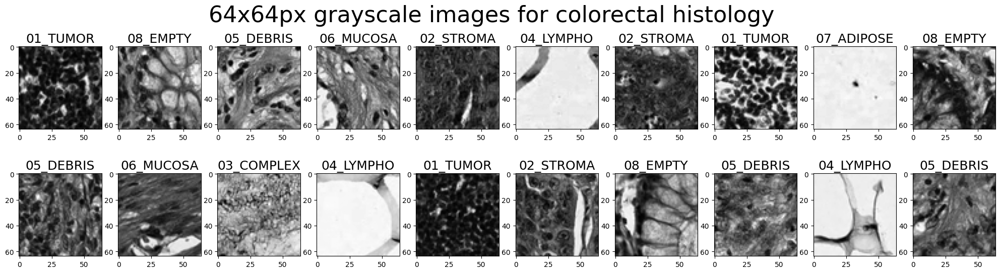

In [43]:
## Visualize grayscale images 
classes = img_labels
fig = plt.figure(figsize=(25,6))
label_to_class_dict = {i:l for i,l in enumerate(classes)}
pixel_array = np.random.choice(len(pixels), 20)
for i, idx in enumerate(pixel_array):
    fig.add_subplot(2,10,i+1)
    img = pixels.iloc[idx,:-1]
    label = pixels.label[idx]
    plt.imshow(np.array(img).reshape(64,64), cmap = 'gray')
    plt.title(label_to_class_dict[label], fontsize=18)
fig.suptitle('64x64px grayscale images for colorectal histology', fontsize = 32)

In [44]:
def pixel_tsne_plot(feature_df, classes, title='t-SNE plot'):
    label_to_id_dict = {v:i for i,v in enumerate(classes)}
    id_to_label_dict = {v: k for k, v in label_to_id_dict.items()}
    feature_df['class_label'] = feature_df.label.map(id_to_label_dict)
    data = feature_df.iloc[:,:-2]
    data = np.reshape(data, (data.shape[0], -1)).astype(np.float64)
    data_2d = bh_sne(data)
    df_subset = pd.DataFrame({'tsne-2d-one':data_2d[:,0], 'tsne-2d-two':data_2d[:,1], 'target':feature_df.class_label})
    plt.figure(figsize=(8,8))
    tsne = sns.scatterplot(
        x="tsne-2d-one", y="tsne-2d-two",
        hue="target",
        hue_order=classes,
        palette=sns.color_palette("hls", len(classes)),
        data=df_subset,
        legend="full",
        alpha=1)
    plt.title(title, fontsize=20)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.show(tsne)

In [45]:
from sklearn.utils import shuffle
#classes = list(map(lambda x:x.split('_')[1], img_labels))
classes = img_labels
pixel_tsne_plot(shuffle(pixels), classes, title = 't-SNE plot for raw image pixels')

NameError: name 'bh_sne' is not defined